# Getting Started

## Overview
This semester, all homeworks will be conducted through Google Colab notebooks. All code for the homework assignment will be written and run in this notebook. Running in Colab will automatically provide a GPU, but you may also run this notebook locally by following [these instructions](https://research.google.com/colaboratory/local-runtimes.html) if you wish to use your own GPU.

You will save images in the notebooks to use and fill out a given LaTeX template which will be submitted to Gradescope, along with your notebook code.

## Using Colab
On the left-hand side, you can click the different icons to see a Table of Contents of the assignment, as well as local files accessible through the notebook.

Make sure to go to **Runtime -> Change runtime type** and select **GPU** as the hardware accelerator. This allows you to use a GPU. Run the cells below to get started on the assignment. Note that a session is open for a maximum of 12 hours, and using too much GPU compute may result in restricted access for a short period of time. Please start the homework early so you have ample time to work.

**If you loaded this notebook from clicking "Open in Colab" from github, you will need to save it to your own Google Drive to keep your work.**

## General Tips
In each homework problem, you will implement an autoregressive model and run it on two datasets (dataset 1 and dataset 2). The expected outputs for dataset 1 are already provided to help as a sanity check.

Feel free to print whatever output (e.g. debugging code, training code, etc) you want, as the graded submission will be the submitted pdf with images.

After you complete the assignment, download all of the image outputted in the results/ folder and upload them to the figure folder in the given latex template.

Run the cells below to download and load up the starter code. It may take longer to run since we are using larger datasets.

In [ ]:
!if [ -d deepul ]; then rm -Rf deepul; fi
!git clone https://github.com/rll/deepul.git
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1lWjGICwgzgcBDejo9S5g69hLAf0O3lGF' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1lWjGICwgzgcBDejo9S5g69hLAf0O3lGF" -O hw3_data.zip && rm -rf /tmp/cookies.txt
!unzip -qq hw3_data.zip -d deepul/homeworks/hw3/data
!rm hw3_data.zip
!pip install ./deepul

Cloning into 'deepul'...
remote: Enumerating objects: 758, done.
remote: Total 758 (delta 0), reused 0 (delta 0), pack-reused 758
Receiving objects: 100% (758/758), 118.40 MiB | 27.50 MiB/s, done.
Resolving deltas: 100% (347/347), done.
Updating files: 100% (129/129), done.
--2023-08-02 18:12:19--  https://docs.google.com/uc?export=download&confirm=t&id=1lWjGICwgzgcBDejo9S5g69hLAf0O3lGF
Resolving docs.google.com (docs.google.com)... 142.251.171.113, 142.251.171.101, 142.251.171.139, ...
Connecting to docs.google.com (docs.google.com)|142.251.171.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-48-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/c9ia9lnluallmf8corbc74u1so616frd/1690999875000/06419056966375271799/*/1lWjGICwgzgcBDejo9S5g69hLAf0O3lGF?e=download&uuid=35e2363a-aa1c-4db0-8d82-d34770bc04d3 [following]
--2023-08-02 18:12:19--  https://doc-08-48-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7d

In [ ]:
from deepul.hw3_helper import *

import torch
import torch.optim as optim
import torch.utils.data as data
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import deepul.pytorch_util as ptu
import deepul.pytorch_util as ptu
from tqdm import trange, tqdm_notebook
import matplotlib.pyplot as plt
import time

ptu.set_gpu_mode(False)

# Question 1: VAEs on 2D Data [20pts]
In this question, you will train a simple VAE on 2D data, and look at situations in which latents are being used or not being used (i.e. when posterior collapse occurs)

## Part (a) Data from a Full Covariance Gaussian [10 pts]
In this part, we train a VAE on data generated from a Gaussian with a full covariance matrix. Execute the cell below to visualize the datasets.

Dataset 1


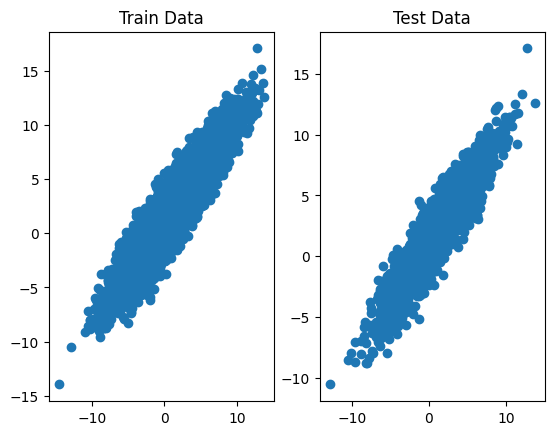

Dataset 2


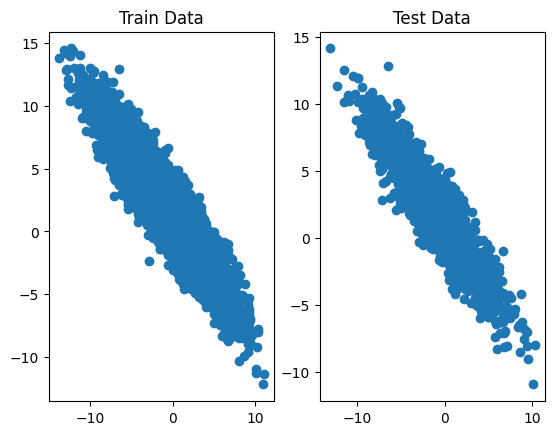

In [ ]:
visualize_q1_data('a', 1)
visualize_q1_data('a', 2)

Consruct and train a VAE with the following characteristics
*   2D latent variables $z$ with a standard normal prior, $p(z) = N(0, I)$
*   An approximate posterior $q_\theta(z|x) = N(z; \mu_\theta(x), \Sigma_\theta(x))$, where $\mu_\theta(x)$ is the mean vector, and $\Sigma_\theta(x)$ is a diagonal covariance matrix
*   A decoder $p(x|z) = N(x; \mu_\phi(z), \Sigma_\phi(z))$, where $\mu_\phi(z)$ is the mean vector, and $\Sigma_\phi(z)$ is a diagonal covariance matrix

**You will provide the following deliverables**


1.   Over the course of training, record the average full negative ELBO, reconstruction loss $E_xE_{z\sim q(z|x)}[-\log{p(x|z)}]$, and KL term $E_x[D_{KL}(q(z|x)||p(z))]$ of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves.
2.   Report the final test set performance of your final model
3. Samples of your trained VAE with ($z\sim p(z), x\sim N(x;\mu_\phi(z),\Sigma_\phi(z))$) and without ($z\sim p(z), x = \mu_\phi(z)$) decoder noise




### Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
def train(model, train_loader, optimizer, device):
  model.train()
  train_loss = {'loss': [], 'reconstruction_loss': [], 'kl_loss': []}

  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):
    x = x.float().to(device).contiguous()
    loss, reconstruction_loss, kl_loss = model(x)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    train_loss['reconstruction_loss'].append(reconstruction_loss.item())
    train_loss['kl_loss'].append(kl_loss.item())
    train_loss['loss'].append(loss.item())
  return train_loss


def eval_loss(model, data_loader, device):
  model.eval()
  total_loss = 0
  total_reconstruction_loss = 0
  total_kl_loss = 0
  with torch.no_grad():
    for x in data_loader:
      x = x.float().to(device).contiguous()
      loss, reconstruction_loss, kl_loss = model(x)
      total_loss += loss * x.shape[0]
      total_reconstruction_loss += reconstruction_loss * x.shape[0]
      total_kl_loss += kl_loss * x.shape[0]
    avg_loss = total_loss / len(data_loader.dataset)
    avg_reconstruction_loss = total_reconstruction_loss / len(data_loader.dataset)
    avg_kl_loss = total_kl_loss / len(data_loader.dataset)
  return avg_loss.item(), avg_reconstruction_loss.item(), avg_kl_loss.item()


def train_epochs(model, train_loader, test_loader, epochs, lr, device):
  optimizer = optim.Adam(model.parameters(), lr=lr)

  test_loss = {'loss': [], 'reconstruction_loss': [], 'kl_loss': []}
  test, test_reconstruction_loss, test_kl_loss = eval_loss(model, test_loader, device)
  test_loss['loss'].append(test)
  test_loss['reconstruction_loss'].append(test_reconstruction_loss)
  test_loss['kl_loss'].append(test_kl_loss)

  train_loss = {'loss': [], 'reconstruction_loss': [], 'kl_loss': []}

  for epoch in range(epochs):
    model.train()
    epochs_train_loss = train(model, train_loader, optimizer, device)
    train_loss['loss'].extend(epochs_train_loss['loss'])
    train_loss['reconstruction_loss'].extend(epochs_train_loss['reconstruction_loss'])
    train_loss['kl_loss'].extend(epochs_train_loss['kl_loss'])

    test, test_reconstruction_loss, test_kl_loss = eval_loss(model, test_loader, device)
    test_loss['loss'].append(test)
    test_loss['reconstruction_loss'].append(test_reconstruction_loss)
    test_loss['kl_loss'].append(test_kl_loss)

    if epoch%10==0:
      print(f"Epoch: {epoch}/{epochs}, Train Loss: {train_loss['loss'][-1]}, Test Loss: {test_loss['loss'][-1]}")

  return train_loss, test_loss

In [ ]:
# model
class SimpleVAE(nn.Module):
  def __init__(self, device):
    super().__init__()
    self.device = device
    self.encoder = nn.Sequential(nn.Linear(2, 128),
                                 nn.ReLU(),
                                 nn.Linear(128, 64),
                                 nn.ReLU(),
                                 nn.Linear(64, 32),
                                 nn.ReLU(),
                                 nn.Linear(32, 4))

    self.decoder = nn.Sequential(nn.Linear(2, 32),
                                 nn.ReLU(),
                                 nn.Linear(32, 64),
                                 nn.ReLU(),
                                 nn.Linear(64, 128),
                                 nn.ReLU(),
                                 nn.Linear(128, 4))

  def forward(self, x):
    b = x.shape[0]
    x = x.view(b, -1)
    mu_z, log_scale_z = self.encoder(x).chunk(2, dim=1)
    z = torch.randn_like(mu_z).to(self.device) * torch.exp(log_scale_z) + mu_z
    mu_x, log_scale_x = self.decoder(z).chunk(2, dim=1)

    reconstruction_loss = - torch.distributions.Normal(mu_x, torch.exp(log_scale_x)).log_prob(x)
    reconstruction_loss = torch.mean(reconstruction_loss.sum(dim=1))
    kl_loss = 0.5*(mu_z**2 + torch.exp(2*log_scale_z) - 1 - 2*log_scale_z)
    kl_loss = torch.mean(kl_loss.sum(dim=1))
    loss = reconstruction_loss + kl_loss

    return loss, reconstruction_loss, kl_loss

  def sample(self, n, noise=True):
    with torch.no_grad():
      z = torch.randn(n, 2).to(self.device)
      mu_x, log_scale_x = self.decoder(z).chunk(2, dim=1)
      if noise:
        x = mu_x + torch.exp(log_scale_x)*torch.randn_like(mu_x).to(self.device)
      else:
        x = mu_x
      return x.cpu().numpy()

In [ ]:
def q1(train_data, test_data, part, dset_id):
    """
    train_data: An (n_train, 2) numpy array of floats
    test_data: An (n_test, 2) numpy array of floats

    (You probably won't need to use the two inputs below, but they are there
     if you want to use them)
    part: An identifying string ('a' or 'b') of which part is being run. Most likely
          used to set different hyperparameters for different datasets
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
               used to set different hyperparameters for different datasets

    Returns
    - a (# of training iterations, 3) numpy array of full negative ELBO, reconstruction loss E[-log p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated every minibatch
    - a (# of epochs + 1, 3) numpy array of full negative ELBO, reconstruciton loss E[-p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated once at initialization and after each epoch
    - a numpy array of size (1000, 2) of 1000 samples WITH decoder noise, i.e. sample z ~ p(z), x ~ p(x|z)
    - a numpy array of size (1000, 2) of 1000 samples WITHOUT decoder noise, i.e. sample z ~ p(z), x = mu(z)
    """

    """ YOUR CODE HERE """

    device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
    model = SimpleVAE(device).to(device)
    # print(model)

    train_loader = data.DataLoader(train_data, batch_size=128, shuffle=True)
    test_loader = data.DataLoader(test_data, batch_size = 128, shuffle=True)

    train_loss, val_loss = train_epochs(model, train_loader, test_loader, epochs=50, lr=1e-3, device = device)
    train_loss = np.stack((train_loss['loss'], train_loss['reconstruction_loss'], train_loss['kl_loss']), axis=1)    # (# of training iterations, 3)
    val_loss = np.stack((val_loss['loss'], val_loss['reconstruction_loss'], val_loss['kl_loss']), axis=1)            # (# of epochs + 1, 3)

    sample_with_noise = model.sample(1000, noise=True)
    sample_without_noise = model.sample(1000, noise=False)

    return train_loss, val_loss, sample_with_noise, sample_without_noise

### Results
Once you've finished `q1_a`, execute the cells below to visualize and save your results.

<ipython-input-4-c0c4dfeb95fd>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 6.751821041107178, Test Loss: 5.430608749389648


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 5.2290825843811035, Test Loss: 5.35250186920166


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 5.007938861846924, Test Loss: 4.717441558837891


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 4.648879051208496, Test Loss: 4.62821102142334


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 4.979682922363281, Test Loss: 4.672346591949463


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 4.5227, Recon Loss: 2.9063, KL Loss: 1.6164


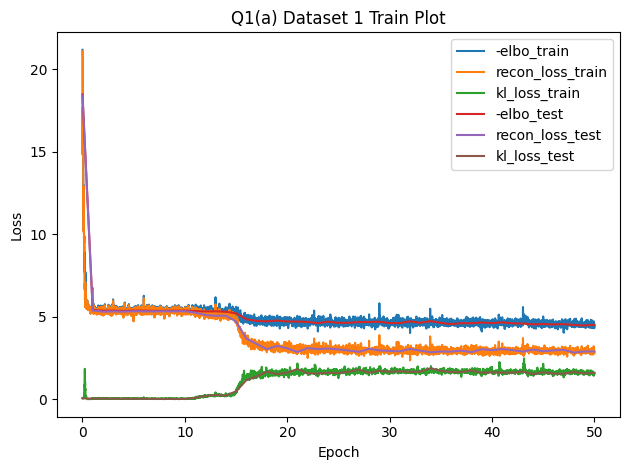

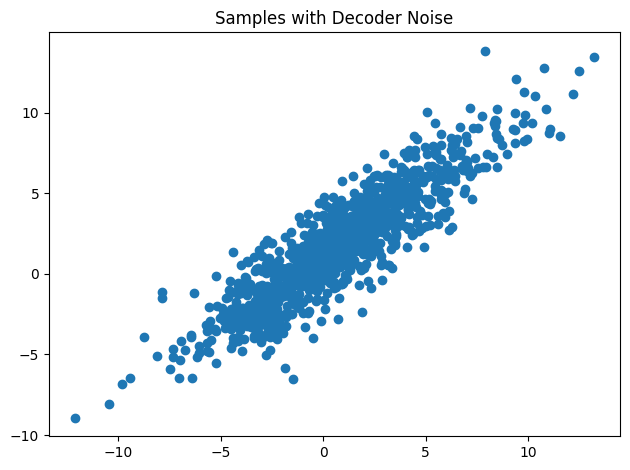

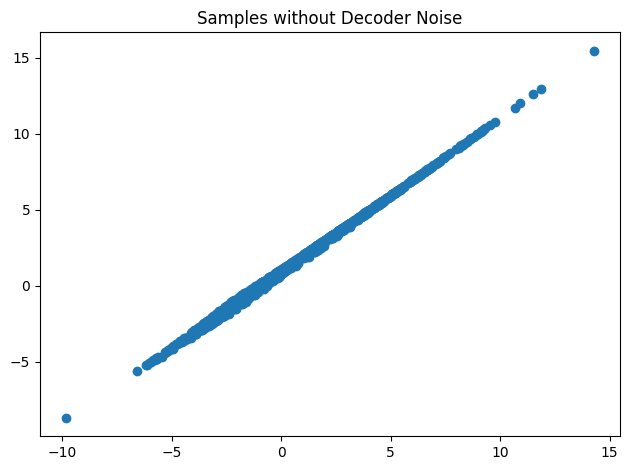

In [ ]:
q1_save_results('a', 1, q1)

<ipython-input-4-c0c4dfeb95fd>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 5.80358362197876, Test Loss: 5.414056777954102


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 5.831023693084717, Test Loss: 5.258934497833252


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 5.02316951751709, Test Loss: 4.444543838500977


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 4.709787845611572, Test Loss: 4.432273864746094


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 4.568179130554199, Test Loss: 4.449463367462158


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 4.4478, Recon Loss: 2.8187, KL Loss: 1.6291


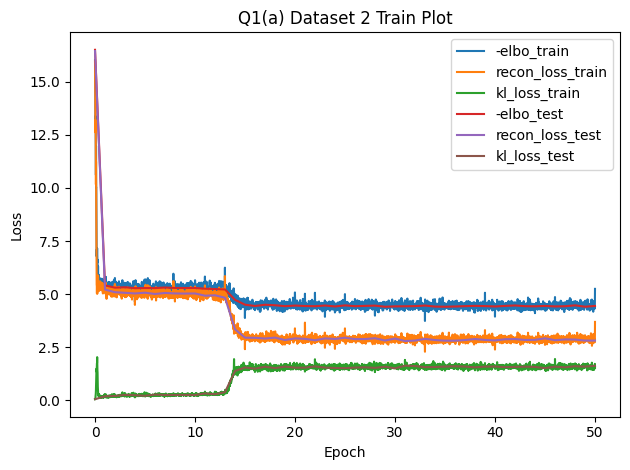

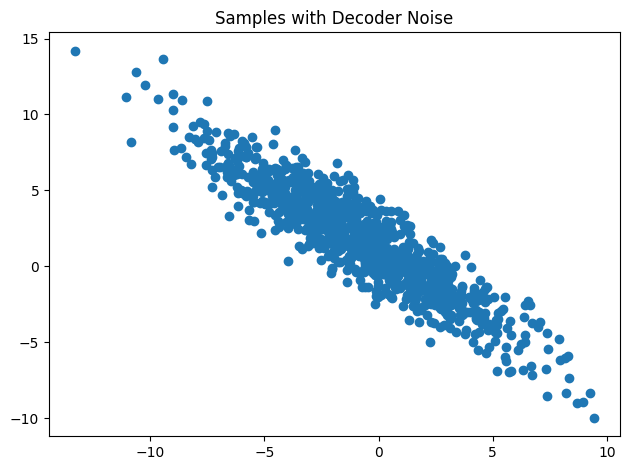

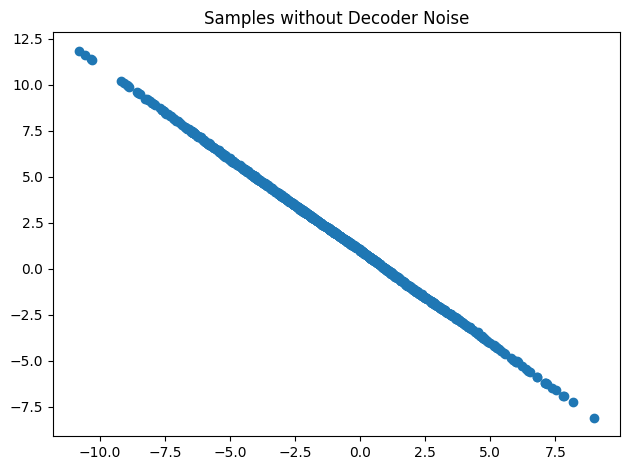

In [ ]:
q1_save_results('a', 2, q1)

## Part (b) Data from a Diagonal Gaussian [10pts]
In this part, we use your code from the previous part to train a VAE on data generated from a diagonal gaussian. Execute the cell below to visualize the datasets (note that they may look the same, but notice the axes)

Dataset 1


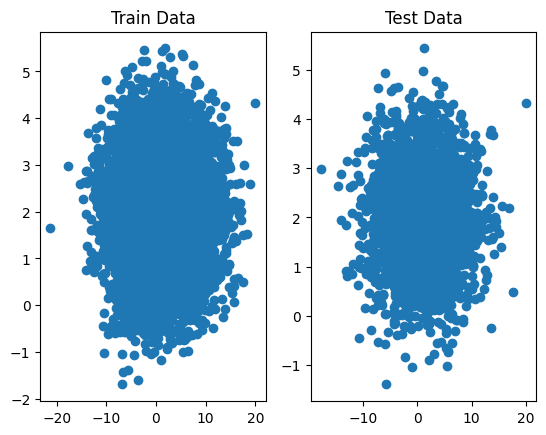

Dataset 2


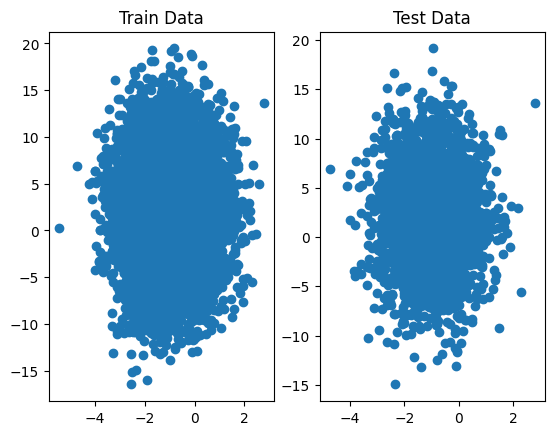

In [ ]:
visualize_q1_data('b', 1)
visualize_q1_data('b', 2)

### Results
Execute the cells below to visualize and save your results.

<ipython-input-4-c0c4dfeb95fd>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 4.572144031524658, Test Loss: 4.551616191864014


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 5.069497585296631, Test Loss: 4.43619441986084


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 4.322211742401123, Test Loss: 4.419708728790283


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 4.387121200561523, Test Loss: 4.433394908905029


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 4.256943702697754, Test Loss: 4.419154167175293


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 4.4175, Recon Loss: 4.4169, KL Loss: 0.0006


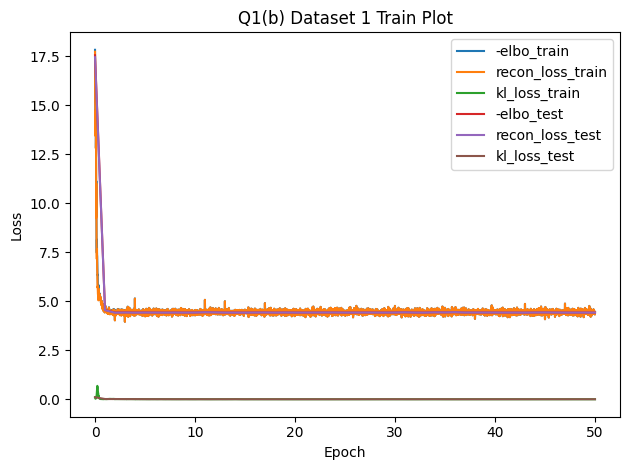

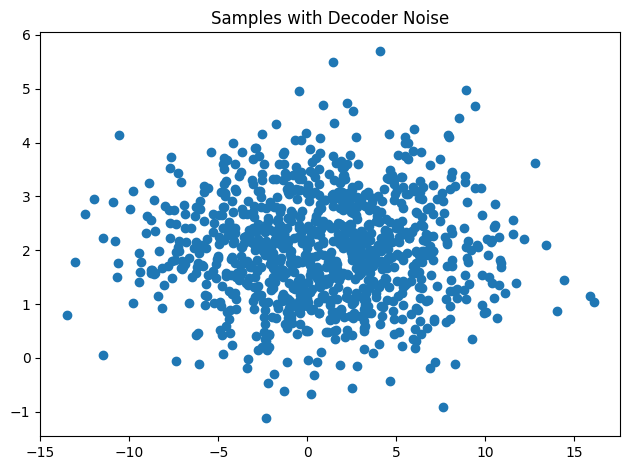

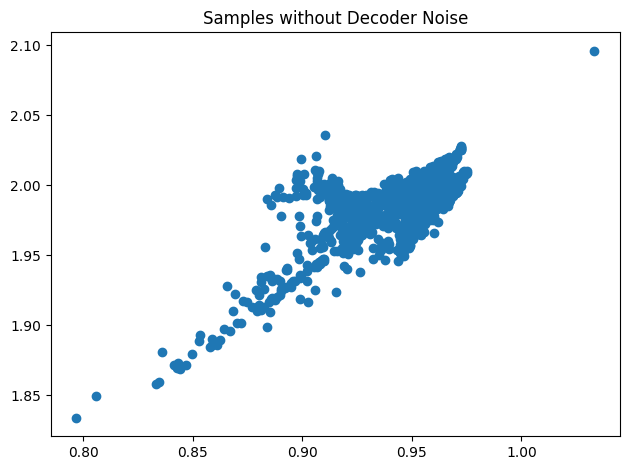

In [ ]:
q1_save_results('b', 1, q1)

<ipython-input-4-c0c4dfeb95fd>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 4.704370498657227, Test Loss: 4.535960674285889


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 4.505327224731445, Test Loss: 4.422339916229248


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 4.410181522369385, Test Loss: 4.419572830200195


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 4.227149963378906, Test Loss: 4.416476249694824


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 4.377796173095703, Test Loss: 4.417992115020752


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 4.4194, Recon Loss: 4.4191, KL Loss: 0.0002


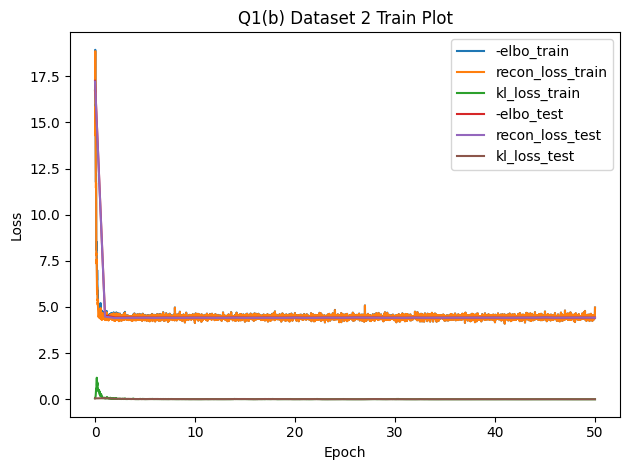

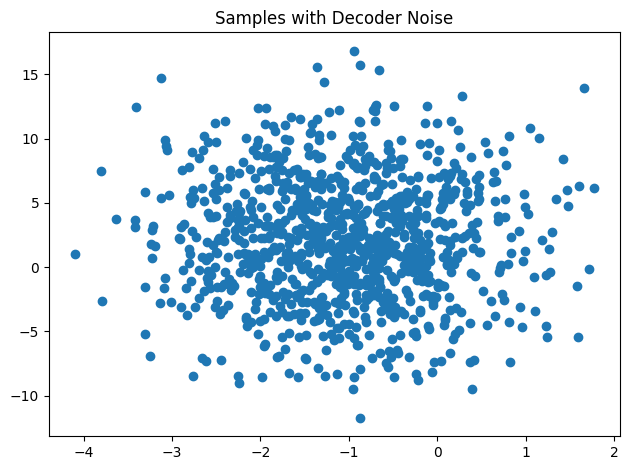

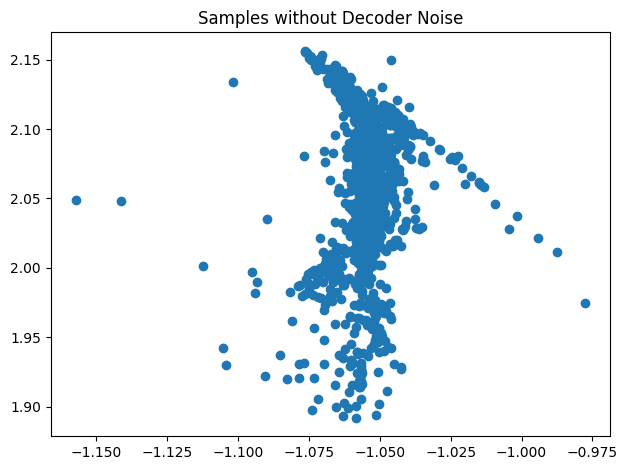

In [ ]:
q1_save_results('b', 2, q1)

### Reflection
Compare the sampled xs with and without decoder noise in parts (a) and (b). For which datasets are the latents being used? Why is this happening (i.e. why are the latents being ignored in some cases)? **Write your answer (1-2 sentences) in the given latex template**

# Question 2: VAEs on Images [40pts]
In this question, you will train different VAE models on image datasets. Execute the cell below to visualize the two datasets (colored shapes, and [SVHN](http://ufldl.stanford.edu/housenumbers/)).

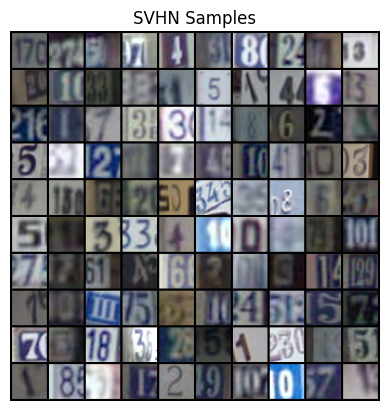

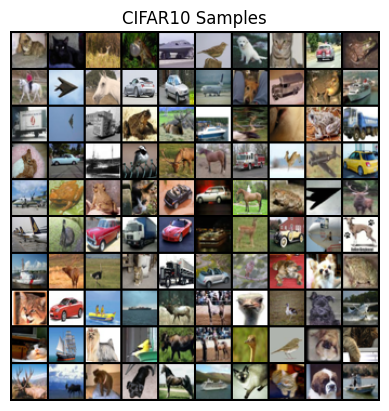

In [ ]:
visualize_svhn()
visualize_cifar10()

## Part (a) VAE [20pts]
In this part, implement a standard VAE with the following characteristics:

*   16-dim latent variables $z$ with standard normal prior $p(z) = N(0,I)$
*   An approximate posterior $q_\theta(z|x) = N(z; \mu_\theta(x), \Sigma_\theta(x))$, where $\mu_\theta(x)$ is the mean vector, and $\Sigma_\theta(x)$ is a diagonal covariance matrix
*   A decoder $p(x|z) = N(x; \mu_\phi(z), I)$, where $\mu_\phi(z)$ is the mean vector. (We are not learning the covariance of the decoder)

You can play around with different architectures and try for better results, but the following encoder / decoder architecture below suffices (Note that image input is always $32\times 32$.
```
conv2d(in_channels, out_channels, kernel_size, stride, padding)
transpose_conv2d(in_channels, out_channels, kernel_size, stride, padding)
linear(in_dim, out_dim)

Encoder
    conv2d(3, 32, 3, 1, 1)
    relu()
    conv2d(32, 64, 3, 2, 1) # 16 x 16
    relu()
    conv2d(64, 128, 3, 2, 1) # 8 x 8
    relu()
    conv2d(128, 256, 3, 2, 1) # 4 x 4
    relu()
    flatten()
    linear(4 * 4 * 256, 2 * latent_dim)

Decoder
    linear(latent_dim, 4 * 4 * 128)
    relu()
    reshape(4, 4, 128)
    transpose_conv2d(128, 128, 4, 2, 1) # 8 x 8
    relu()
    transpose_conv2d(128, 64, 4, 2, 1) # 16 x 16
    relu()
    transpose_conv2d(64, 32, 4, 2, 1) # 32 x 32
    relu()
    conv2d(32, 3, 3, 1, 1)
```

You may find the following training tips helpful
*   When computing reconstruction loss and KL loss, average over the batch dimension and **sum** over the feature dimension
*   When computing reconstruction loss, it suffices to just compute MSE between the reconstructed $x$ and true $x$ (you can compute the extra constants if you want)
*   Use batch size 128, learning rate $10^{-3}$, and an Adam optimizer




**You will provide the following deliverables**


1.   Over the course of training, record the average full negative ELBO, reconstruction loss, and KL term of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves.
2.   Report the final test set performance of your final model
3. 100 samples from your trained VAE
4. 50 real-image / reconstruction pairs (for some $x$, encode and then decode)
5. Interpolations of length 10 between 10 pairs of test images from your VAE (100 images total)



### Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
# model

class Encoder(nn.Module):
  def __init__(self, latent_dim):
    super().__init__()
    self.net1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
                             nn.ReLU(),
                             nn.Conv2d(32, 64, 3, 2, 1),    # 16 x 16
                             nn.ReLU(),
                             nn.Conv2d(64, 128, 3, 2, 1),   # 8 x 8
                             nn.ReLU(),
                             nn.Conv2d(128, 256, 3, 2, 1),  # 4 x 4
                             nn.ReLU())
    self.net2 = nn.Linear(256*16, 2*latent_dim)

  def forward(self, x):
    x = self.net1(x).view(x.shape[0], -1)
    # print('en ', x.shape)
    mu_z, log_std_z = self.net2(x).chunk(2, dim=1) # mu, log_std: [batch, 16]
    # print('oke 1')
    return mu_z, log_std_z


class Decoder(nn.Module):
  def __init__(self, latent_dim):
    super().__init__()
    self.net1 = nn.Sequential(nn.Linear(latent_dim, 4*4*128),
                              nn.ReLU())
    self.net2 = nn.Sequential(nn.ConvTranspose2d(128, 128, 4, 2, 1),    # 8 x 8
                              nn.ReLU(),
                              nn.ConvTranspose2d(128, 64, 4, 2, 1),     # 16 x 16
                              nn.ReLU(),
                              nn.ConvTranspose2d(64, 32, 4, 2, 1),      # 32 x 32
                              nn.ReLU(),
                              nn.ConvTranspose2d(32, 3, 3, 1, 1))

  def forward(self, x):
    # print('de 0 ', x.shape)
    x = self.net1(x)
    # print('de ', x.shape)
    x = x.view(x.shape[0], 128, 4, 4)
    mu_x = self.net2(x)
    # print('oke')
    return mu_x


class VAE(nn.Module):
  def __init__(self, latent_dim, device):
    super().__init__()
    self.device = device
    self.latent_dim = latent_dim
    self.encoder = Encoder(latent_dim)
    self.decoder = Decoder(latent_dim)

  def forward(self, x):
    mu_z, log_std_z = self.encoder(x)
    z =  torch.exp(log_std_z)*torch.randn_like(mu_z) + mu_z
    mu_x = self.decoder(z)

    # reconstruction_loss = -torch.distributions.Normal(mu_x, 1.0).log_prob(x)
    # reconstruction_loss = torch.mean(reconstruction_loss.sum(dim=1))
    reconstruction_loss = (x-mu_x)**2
    reconstruction_loss = torch.mean(reconstruction_loss.sum(dim=[1, 2, 3]))

    kl_loss = 0.5*(mu_z**2 + torch.exp(2*log_std_z) - 1.0 - 2*log_std_z)
    kl_loss = torch.mean(kl_loss.sum(dim=1))

    loss = reconstruction_loss + kl_loss

    return loss, reconstruction_loss, kl_loss

  def sample(self, n, noise=True):
    with torch.no_grad():
      z = torch.randn(n, self.latent_dim).to(self.device)
      mu_x = self.decoder(z)
      if noise:
        x = mu_x + torch.randn_like(mu_x)
      else:
        x = mu_x

      return x.permute(0, 2, 3, 1).cpu().numpy()

  def interpolation(self, loader):
    self.encoder.eval()
    self.decoder.eval()
    with torch.no_grad():
      x = next(iter(loader))[:20].to(self.device).float()

      z, _ = self.encoder(x)
      latent_values = []
      for i in range(0, z.shape[0], 2):
        z0 = z[i, :]
        z1 = z[i+1, :]
        for j in np.linspace(0, 1, 10):
          latent_values.append(z0 + j*(z1-z0))

      latent_values = torch.stack(latent_values, dim=0)
      interpolations = self.decoder(latent_values) * 255.0

      return interpolations.permute(0, 2, 3, 1).cpu().numpy()

  def reconstruction(self, loader):
    self.encoder.eval()
    self.decoder.eval()
    with torch.no_grad():
      x = next(iter(loader))[:50].to(self.device).float()
      z, _ = self.encoder(x)
      x_reconstructed = self.decoder(z)

    reconstructions = torch.stack((x, x_reconstructed), dim=1).view(-1, 3, 32, 32) * 255.0
    return reconstructions.permute(0, 2, 3, 1).cpu().numpy()

In [ ]:
def q2_a(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 32, 32, 3) uint8 numpy array of color images with values in {0, ..., 255}
    test_data: An (n_test, 32, 32, 3) uint8 numpy array of color images with values in {0, ..., 255}
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
               used to set different hyperparameters for different datasets

    Returns
    - a (# of training iterations, 3) numpy array of full negative ELBO, reconstruction loss E[-log p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated every minibatch
    - a (# of epochs + 1, 3) numpy array of full negative ELBO, reconstruciton loss E[-p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated once at initialization and after each epoch
    - a (100, 32, 32, 3) numpy array of 100 samples from your VAE with values in {0, ..., 255}
    - a (100, 32, 32, 3) numpy array of 50 real image / reconstruction pairs
      FROM THE TEST SET with values in {0, ..., 255}
    - a (100, 32, 32, 3) numpy array of 10 interpolations of length 10 between
      pairs of test images. The output should be those 100 images flattened into
      the specified shape with values in {0, ..., 255}
    """

    """ YOUR CODE HERE """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = VAE(16, device).to(device)

    train_data = np.transpose(train_data, axes=[0, 3, 1, 2])/255.0
    test_data = np.transpose(test_data, axes=[0, 3, 1, 2])/255.0
    train_loader = data.DataLoader(train_data, batch_size=128, shuffle=True)
    test_loader = data.DataLoader(test_data, batch_size=128, shuffle=True)

    train_loss, val_loss = train_epochs(model, train_loader, test_loader, epochs=40, lr=1e-3, device = device)
    train_loss = np.stack((train_loss['loss'], train_loss['reconstruction_loss'], train_loss['kl_loss']), axis=1)    # (# of training iterations, 3)
    val_loss = np.stack((val_loss['loss'], val_loss['reconstruction_loss'], val_loss['kl_loss']), axis=1)            # (# of epochs + 1, 3)

    sample_with_noise = model.sample(100, noise=False) * 255
    # sample_without_noise = model.sample(1000, noise=False)

    interpolations = model.interpolation(test_loader)
    reconstructions = model.reconstruction(test_loader)

    return train_loss, val_loss, sample_with_noise, reconstructions, interpolations

### Results
Once you've finished `q2_a`, execute the cells below to visualize and save your results.

<ipython-input-9-aece4a13270a>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/40, Train Loss: 62.52838134765625, Test Loss: 87.29802703857422


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/40, Train Loss: 43.72241973876953, Test Loss: 44.89915084838867


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/40, Train Loss: 34.14237976074219, Test Loss: 40.66997528076172


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/40, Train Loss: 37.85185241699219, Test Loss: 39.25351333618164


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 38.9134, Recon Loss: 27.6792, KL Loss: 11.2342


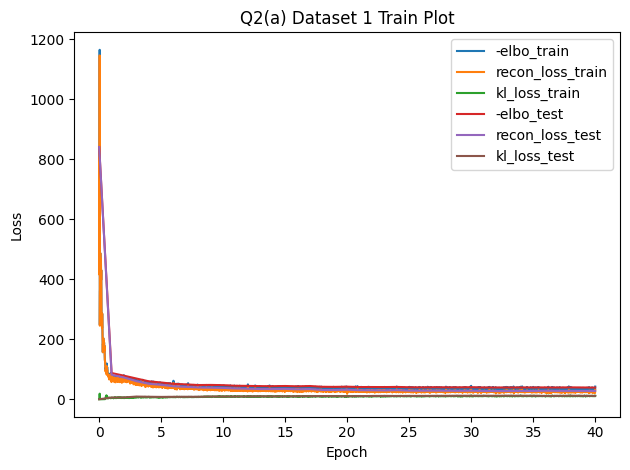

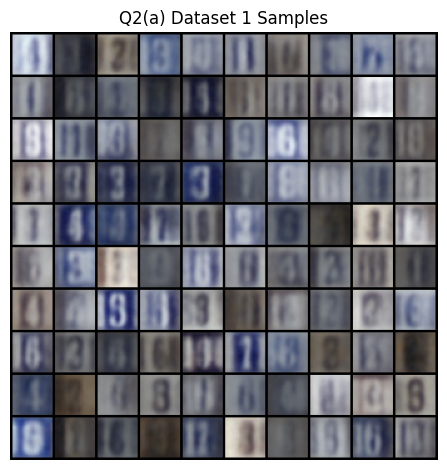

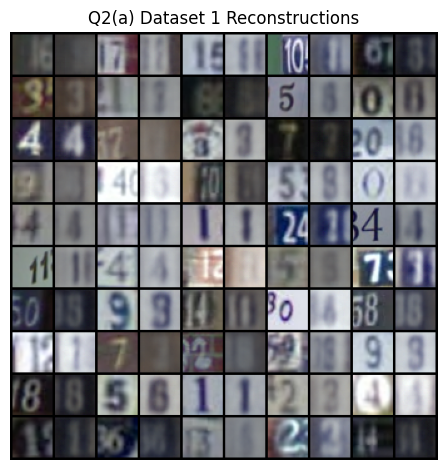

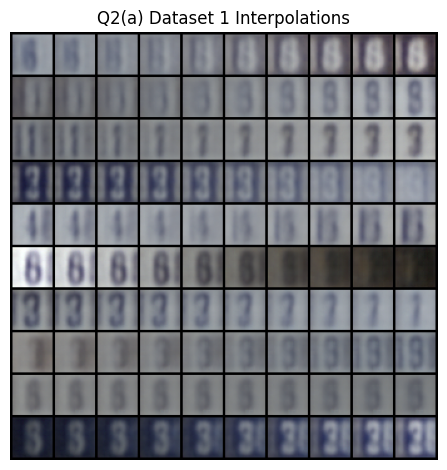

In [ ]:
q2_save_results('a', 1, q2_a)

<ipython-input-9-aece4a13270a>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 0/40, Train Loss: 101.03549194335938, Test Loss: 98.36344146728516


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 10/40, Train Loss: 77.91954040527344, Test Loss: 78.49828338623047


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 20/40, Train Loss: 74.17877960205078, Test Loss: 77.8322982788086


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 30/40, Train Loss: 79.68887329101562, Test Loss: 76.77729034423828


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Final -ELBO: 77.0910, Recon Loss: 58.8496, KL Loss: 18.2413


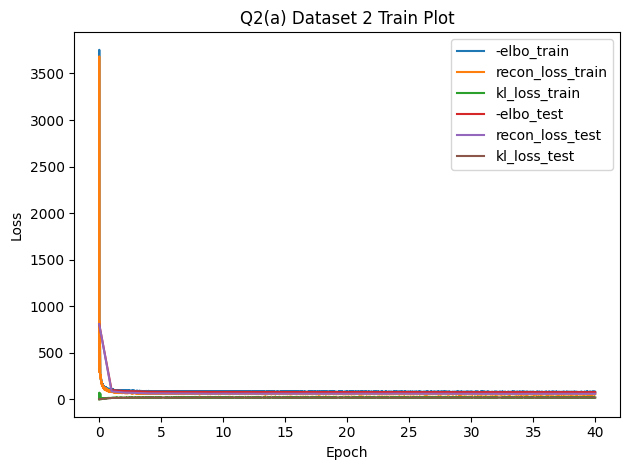

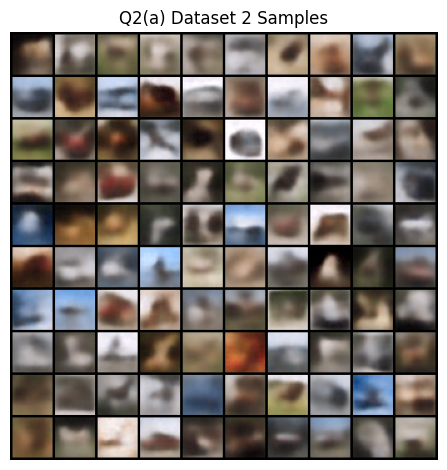

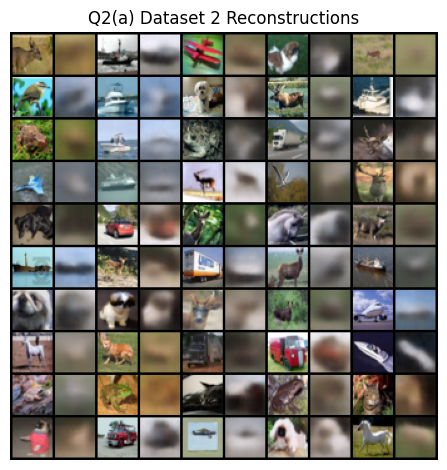

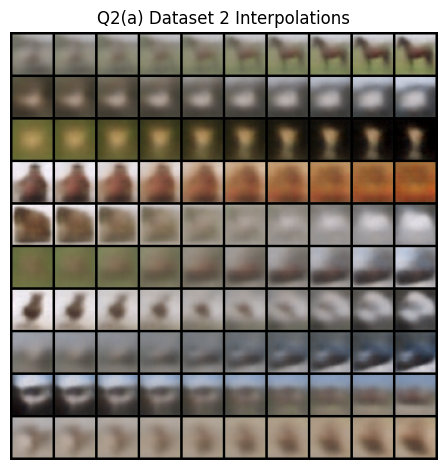

In [ ]:
q2_save_results('a', 2, q2_a)

## Part (b) VAE with AF Prior [20pts]
In this part, implement a VAE with an Autoregressive Flow prior ([VLAE](https://arxiv.org/abs/1611.02731)) with the following characteristics:

*   16-dim latent variables $z$ with a MADE prior, with $\epsilon \sim N(0, I)$
*   An approximate posterior $q_\theta(z|x) = N(z; \mu_\theta(x), \Sigma_\theta(x))$, where $\mu_\theta(x)$ is the mean vector, and $\Sigma_\theta(x)$ is a diagonal covariance matrix
*   A decoder $p(x|z) = N(x; \mu_\phi(z), I)$, where $\mu_\phi(z)$ is the mean vector. (We are not learning the covariance of the decoder)

You can use the same encoder / decoder architectures and training hyperparameters as part (a). For your MADE prior, it would suffice to use two hidden layers of size $512$. More explicitly, your MADE AF (mapping from $z\rightarrow \epsilon$) should output location $\mu_\psi(z)$ and scale parameters $\sigma_\psi(z)$ and do the following transformation on $z$:
$$\epsilon = z \odot \sigma_\psi(z) + \mu_\psi(z)$$

where the $i$th element of $\sigma_\psi(z)$ is computed from $z_{<i}$ (same for $\mu_\psi(z)$) and optimize the objective

$$-E_{z\sim q(z|x)}[\log{p(x|z)}] + E_{z\sim q(z|x)}[\log{q(z|x)} - \log{p(z)}]$$
where $$\log{p(z)} = \log{p(\epsilon)} + \log{\det\left|\frac{d\epsilon}{dz}\right|}$$





**You will provide the following deliverables**


1.   Over the course of training, record the average full negative ELBO, reconstruction loss, and KL term of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves.
2.   Report the final test set performance of your final model
3. 100 samples from your trained VAE
4. 50 real-image / reconstruction pairs (for some $x$, encode and then decode)
5. Interpolations of length 10 between 10 pairs of test images from your VAE (100 images total)




### Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
# model
class MaskedLinear(nn.Linear):
  def __init__(self, in_dim, out_dim):
    super().__init__(in_dim, out_dim)
    self.register_buffer('mask', torch.ones(in_dim, out_dim))

  def create_mask(self, mask):
    self.mask = mask

  def forward(self, x):
    # print('made ', x.shape)
    # print('mask ', self.mask.shape)
    # print('weight ', self.weight.shape)
    return F.linear(x, self.mask * self.weight)

class MADE(nn.Module):
  def __init__(self, input_shape, hidden=[512, 512], ordering=None, device='cuda'):
    super().__init__()
    self.input_shape = input_shape
    self.hidden = hidden
    self.nin = np.prod(input_shape)
    self.ordering = np.arange(self.nin) if ordering is None else ordering
    self.nout = self.nin * 2
    self.device = device

    self.net = [MaskedLinear(self.nin, hidden[0]),
                nn.ReLU()]
    for i in range(len(hidden)-1):
      self.net.extend([MaskedLinear(hidden[i], hidden[i+1]),
                      nn.ReLU()])
    self.net += [MaskedLinear(hidden[-1], self.nout)]
    self.net = nn.ModuleList(self.net)
    # print(self.net)
    self.create_mask()
    self.masks = []

  def create_mask(self):
    # m will be used to create masks
    m = []
    m.append(self.ordering)
    for i in range(1, len(self.hidden)+1):
      m.append(np.random.randint(m[i-1].min(), self.nin-1, size=self.hidden[i-1]))
    m.append(m[0])

    # create mask for each layer
    masks = [m[l][:, None] >= m[l-1][None, :] for l in range(1, len(m)-1)]
    masks.append(m[-1][:, None] > m[-2][None, :])
    masks[-1] = np.concatenate((masks[-1], masks[-1]), axis=0)

    for i in range(0, len(self.net), 2):
      self.net[i].create_mask(torch.Tensor(masks[i//2]).to(self.device))

  def forward(self, x):
      x = x.view(x.shape[0], self.nin)    # [b, nin]
      for layer in self.net:
        x = layer(x)
        # print('oke')
      return x                            # [b, nout]


class AFVAE(nn.Module):
  def __init__(self, latent_dim, hidden, device):
    super().__init__()
    self.device = device
    self.latent_dim = latent_dim
    self.encoder = Encoder(latent_dim)
    self.decoder = Decoder(latent_dim)
    self.made = MADE(latent_dim, hidden=hidden, device=device)

  def forward(self, x):
    mu_z, log_std_z = self.encoder(x) # [b, latent_dim]
    z = torch.randn_like(mu_z) * torch.exp(log_std_z) + mu_z
    x_recon = self.decoder(z)

    reconstruction_loss = (x-x_recon)**2
    reconstruction_loss = torch.mean(reconstruction_loss.sum(dim=[1, 2, 3]))
    # reconstruction_loss = F.mse_loss(x_recon, x, reduction='none').view(x.shape[0], -1).sum(1).mean()

    mu_eps, log_std_eps = self.made(z).chunk(2, dim=1)
    log_std_eps = torch.tanh(log_std_eps)
    eps = z * torch.exp(log_std_eps) + mu_eps

    encoder_log_prob = torch.distributions.Normal(mu_z, torch.exp(log_std_z)).log_prob(z)
    # encoder_log_prob = -0.5 * np.log(2 * np.pi) - log_std_z - 0.5 * (z - mu_z) ** 2 * torch.exp(-2 * log_std_z)
    prior_log_prob = torch.distributions.Normal(0.0, 1.0).log_prob(eps) + log_std_eps
    # prior_log_prob = -0.5 * np.log(2 * np.pi) + log_std_eps - 0.5 * eps ** 2
    kl_loss = torch.mean((encoder_log_prob - prior_log_prob).sum(dim=1))

    loss = reconstruction_loss + kl_loss
    return loss, reconstruction_loss, kl_loss

  def sample(self, n):
    with torch.no_grad():
      z = torch.randn(n, self.latent_dim).to(self.device)
      for i in range(self.latent_dim):
        mu_eps, log_std_eps = self.made(z).chunk(2, dim=1)
        mu_eps, log_std_eps = mu_eps[:, i], torch.tanh(log_std_eps[:, i])
        z[:, i] = (z[:, i] - mu_eps) * torch.exp(-log_std_eps)
      samples = self.decoder(z)
      return samples.permute(0, 2, 3, 1).cpu().numpy()


  def interpolation(self, loader):
    self.encoder.eval()
    self.decoder.eval()
    with torch.no_grad():
      x = next(iter(loader))[:20].to(self.device).float()
      z, _ = self.encoder(x)
      latent_values = []
      for i in range(0, z.shape[0], 2):
        z0 = z[i, :]
        z1 = z[i+1, :]
        for j in np.linspace(0, 1, 10):
          latent_values.append(z0 + j*(z1-z0))

      latent_values = torch.stack(latent_values, dim=0)
      interpolations = self.decoder(latent_values) * 255.0
      return interpolations.permute(0, 2, 3, 1).cpu().numpy()

  def reconstruction(self, loader):
    self.encoder.eval()
    self.decoder.eval()
    with torch.no_grad():
      x = next(iter(loader))[:50].to(self.device).float()
      z, _ = self.encoder(x)
      x_reconstructed = self.decoder(z)

    reconstructions = torch.stack((x, x_reconstructed), dim=1).view(-1, 3, 32, 32) * 255.0
    return reconstructions.permute(0, 2, 3, 1).cpu().numpy()

In [ ]:
def q2_b(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 32, 32, 3) uint8 numpy array of color images with values in {0, ..., 255}
    test_data: An (n_test, 32, 32, 3) uint8 numpy array of color images with values in {0, ..., 255}
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
               used to set different hyperparameters for different datasets

    Returns
    - a (# of training iterations, 3) numpy array of full negative ELBO, reconstruction loss E[-log p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated every minibatch
    - a (# of epochs + 1, 3) numpy array of full negative ELBO, reconstruciton loss E[-p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated once at initialization and after each epoch
    - a (100, 32, 32, 3) numpy array of 100 samples from your VAE with values in {0, ..., 255}
    - a (100, 32, 32, 3) numpy array of 50 real image / reconstruction pairs
      FROM THE TEST SET with values in {0, ..., 255}
    - a (100, 32, 32, 3) numpy array of 10 interpolations of length 10 between
      pairs of test images. The output should be those 100 images flattened into
      the specified shape with values in {0, ..., 255}
    """

    """ YOUR CODE HERE """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = AFVAE(512, hidden=[512, 512], device=device).to(device)

    train_data = np.transpose(train_data, axes=[0, 3, 1, 2])/255.0
    test_data = np.transpose(test_data, axes=[0, 3, 1, 2])/255.0
    train_loader = data.DataLoader(train_data, batch_size=128, shuffle=True)
    test_loader = data.DataLoader(test_data, batch_size=128, shuffle=True)

    train_loss, val_loss = train_epochs(model, train_loader, test_loader, epochs=50, lr=1e-3, device = device)
    train_loss = np.stack((train_loss['loss'], train_loss['reconstruction_loss'], train_loss['kl_loss']), axis=1)    # (# of training iterations, 3)
    val_loss = np.stack((val_loss['loss'], val_loss['reconstruction_loss'], val_loss['kl_loss']), axis=1)            # (# of epochs + 1, 3)

    samples = model.sample(100) * 255

    interpolations = model.interpolation(test_loader)
    reconstructions = model.reconstruction(test_loader)

    return train_loss, val_loss, samples, reconstructions, interpolations

### Results
Once you've finished `q2_b`, execute the cells below to visualize and save your results.

<ipython-input-3-aece4a13270a>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 50.50319290161133, Test Loss: 77.57067108154297


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 52.43284225463867, Test Loss: 52.336769104003906


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 51.54226303100586, Test Loss: 48.28157424926758


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 35.87709045410156, Test Loss: 45.074676513671875


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 44.353179931640625, Test Loss: 44.658084869384766


Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Batch:   0%|          | 0/79 [00:00<?, ?it/s]

Final -ELBO: 43.7130, Recon Loss: 32.8409, KL Loss: 10.8721


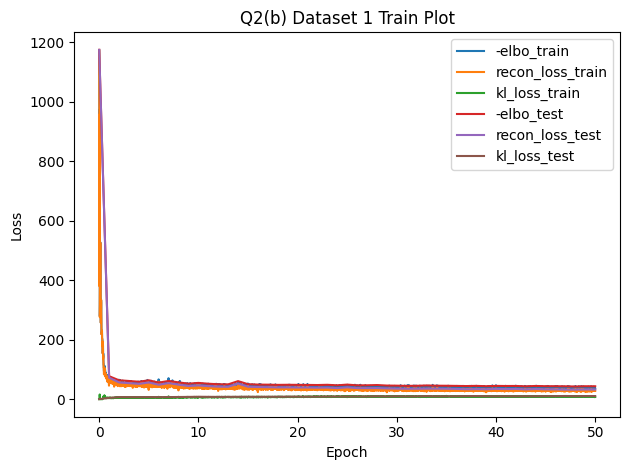

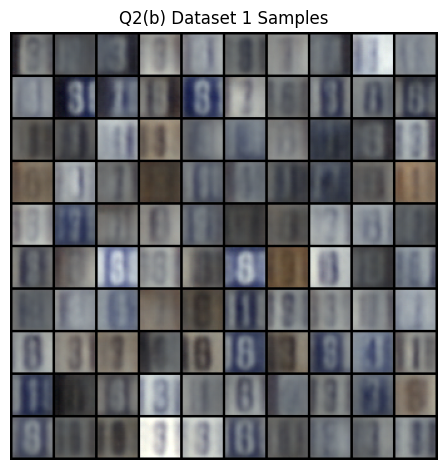

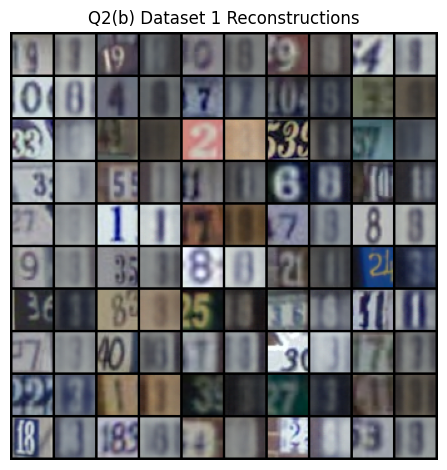

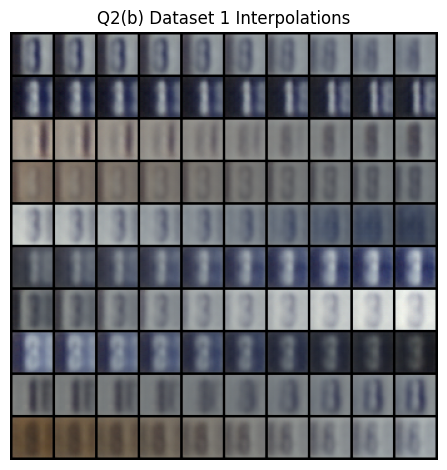

In [ ]:
q2_save_results('b', 1, q2_b)

<ipython-input-3-aece4a13270a>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, x in enumerate(tqdm_notebook(train_loader, desc='Batch', leave=False)):


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 0/50, Train Loss: 100.25920104980469, Test Loss: 101.92475128173828


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 10/50, Train Loss: 78.07479858398438, Test Loss: 80.05048370361328


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 20/50, Train Loss: 78.49127197265625, Test Loss: 77.42027282714844


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 30/50, Train Loss: 79.45199584960938, Test Loss: 77.04456329345703


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 40/50, Train Loss: 76.14036560058594, Test Loss: 76.2962417602539


Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Batch:   0%|          | 0/391 [00:00<?, ?it/s]

Final -ELBO: 75.3285, Recon Loss: 53.3627, KL Loss: 21.9658


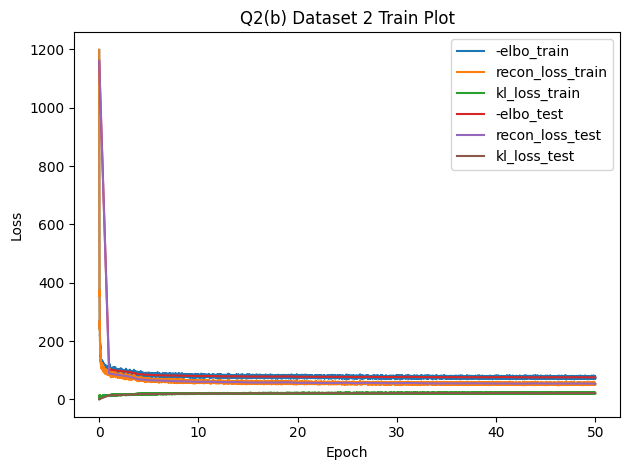

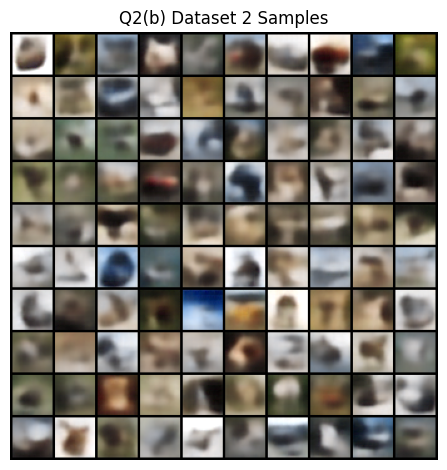

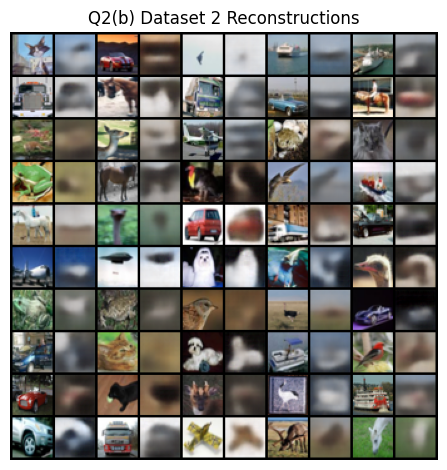

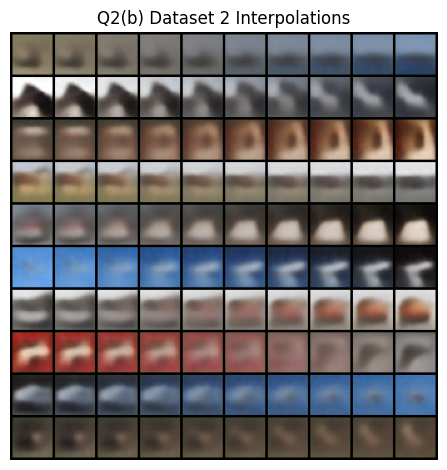

In [ ]:
q2_save_results('b', 2, q2_b)

# Question 3: VQ-VAE [40pts]
In this question, you with train a [VQ-VAE](https://arxiv.org/abs/1711.00937) on the colored shapes dataset and SVHN. If you are confused on how the VQ-VAE works, you may find [Lilian Weng's blogpost](https://lilianweng.github.io/lil-log/2018/08/12/from-autoencoder-to-beta-vae.html#vq-vae-and-vq-vae-2) to be useful.

You may experiment with different hyperparameters and architecture designs, but the following designs for the VQ-VAE architecture may be useful.

```
conv2d(in_channels, out_channels, kernel_size, stride, padding)
transpose_conv2d(in_channels, out_channels, kernel_size, stride, padding)
linear(in_dim, out_dim)
batch_norm2d(dim)

residual_block(dim)
    batch_norm2d(dim)
    relu()
    conv2d(dim, dim, 3, 1, 1)
    batch_norm2d(dim)
    relu()
    conv2d(dim, dim, 1, 1, 0)

Encoder
    conv2d(3, 256, 4, 2, 1) 16 x 16
    batch_norm2d(256)
    relu()
    conv2d(256, 256, 4, 2, 1) 8 x 8
    residual_block(256)
    residual_block(256)

Decoder
    residual_block(256)
    residual_block(256)
    batch_norm2d(256)
    relu()
    transpose_conv2d(256, 256, 4, 2, 1) 16 x 16
    batch_norm2d(256)
    relu()
    transpose_conv2d(256, 3, 4, 2, 1) 32 x 32
```

A few other tips:
*   Use a codebook with $K = 128$ latents each with a $D = 256$ dimensional embedding vector
*   You should initialize each element in your $K\times D$ codebook to be uniformly random in $[-1/K, 1/K]$
*   Use batch size 128 with a learning rate of $10^{-3}$ and an Adam optimizer
*   Center and scale your images to $[-1, 1]$
*   Supposing that $z_e(x)$ is the encoder output, and $z_q(x)$ is the quantized output using the codebook, you can implement the straight-through estimator as follows (where below is fed into the decoder):
  * `(z_q(x) - z_e(x)).detach() + z_e(x)` in Pytorch
  * `tf.stop_gradient(z_q(x) - z_e(x)) + z_e(x)` in Tensorflow.

In addition to training the VQ-VAE, you will also need to train a PixelCNN prior on the categorical latents in order to sample. For your architecture, you may find the following useful:
*   Since the input is a 2D grid of discrete values, you should have an input (learned) embedding layer to map the discrete values to embeddings of length $64$
*   Use a single Type A masked convolutions followed by 10-15 residual blocks (same structure as HW 1), and $2$ $1\times 1$ convolutions of $512$ and $K$ channels respectively.
*   You may find normalization methods (e.g. BatchNorm, LayerNorm) to be useful
*   Use batch size 128 with a learning rate of $10^{-3}$ and an Adam optimizer

**You will provide the following deliverables**


1.   Over the course of training, record the average loss of the training data (per minibatch) and test data (for your entire test set) **for both your VQ-VAE and PixelCNN prior**. Code is provided that automatically plots the training curves.
2. Report the final test set performances of your final models
3. 100 samples from your trained VQ-VAE and PixelCNN prior
4. 50 real-image / reconstruction pairs (for some $x$, encode and then decode)

## Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
# model
class ResidualBlock(nn.Module):
  def __init__(self, channels):
    super().__init__()
    self.net = nn.Sequential(nn.BatchNorm2d(channels),
                             nn.ReLU(),
                             nn.Conv2d(channels, channels, 3, 1, 1),
                             nn.BatchNorm2d(channels),
                             nn.ReLU(),
                             nn.Conv2d(channels, channels, 1, 1, 0))

  def forward(self, x):
    x += self.net(x) # the shape remain unchanged
    return x

class LayerNorm(nn.Module):
  def __init__(self, channels):
    super().__init__()
    self.layer_norm = nn.LayerNorm(channels)

  def forward(self, x):
    x = x.permute(0, 2, 3, 1).contiguous()
    x = self.layer_norm(x)
    return x.permute(0, 3, 1, 2).contiguous()

class MaskedConv2d(nn.Conv2d):
  def __init__(self, mask_type, *args, **kwargs):
    super().__init__(*args, **kwargs)
    assert mask_type in ['A', 'B']
    self.register_buffer('mask', torch.zeros_like(self.weight))
    self.mask = self.create_mask(mask_type)

  def create_mask(self, mask_type):
    mask = torch.zeros_like(self.weight)
    mask[:, :, :self.kernel_size[0]//2, :] = 1
    mask[:, :, :self.kernel_size[0]//2, :self.kernel_size[1]//2] = 1

    if mask_type == 'B':
      mask[:, :, self.kernel_size[0]//2, self.kernel_size[1]//2] = 1

    return mask

  def forward(self, x):
    return F.conv2d(x, self.mask*self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)

class PixelCNN_ResidualBlock(nn.Module):
  def __init__(self, channels):
    super().__init()
    self.net = nn.Sequential(LayerNorm(channels),
                             nn.ReLU(),
                             MaskedConv2d('B', channels, channels//2, 1, 1, 0),
                             LayerNorm(channels//2),
                             nn.ReLU(),
                             MaskedConv2d('B', channels//2, channels//2, 3, 1, 1),
                             LayerNorm(channels//2),
                             nn.ReLU(),
                             MaskedConv2d('B', channels//2, channels, 1, 1, 0))

  def forward(self, x):
    return x + self.net(x) # input_shape remains unchanged

class PixcelCNN(nn.Module):
  def __init__(self, input_shape, code_size, dim, n_layers=10, device='cuda'):
    super().__init__()
    self.input_shape = input_shape
    self.code_size = code_size
    self.device = device

    self.embedding = nn.Embedding(code_size, dim)
    self.net = nn.ModuleList([MaskedConv2d('A', dim, dim, 7, 1, 3)])
    for i in range(n_layers):
      self.net.append(PixelCNN_ResidualBlock(dim))
    self.net.extend([LayerNorm(dim),
                     nn.ReLU(),
                     MaskedConv2d('B', dim, 512, 1, 1, 0),
                     LayerNorm(dim),
                     nn.ReLU(),
                     MaskedConv2d('B', 512, code_size, 1, 1, 0)])

  def forward(self, x):
    """
      Input: x encoding indices of vector quantized layer   [b, h, w]
    """
    y = self.embedding_dim(x)       # [b, h, w, dim]
    y = y.permute(0, 3, 1 , 2)      # [b, dim, h, w]
    y = self.net(y)                 # [b, code_size, h, w]
    return F.cross_entropy(y, x), None, None

  def sample(self, n):




In [ ]:
def q3(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 32, 32, 3) uint8 numpy array of color images with values in [0, 255]
    test_data: An (n_test, 32, 32, 3) uint8 numpy array of color images with values in [0, 255]
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
               used to set different hyperparameters for different datasets

    Returns
    - a (# of training iterations,) numpy array of VQ-VAE train losess evaluated every minibatch
    - a (# of epochs + 1,) numpy array of VQ-VAE train losses evaluated once at initialization and after each epoch
    - a (# of training iterations,) numpy array of PixelCNN prior train losess evaluated every minibatch
    - a (# of epochs + 1,) numpy array of PixelCNN prior train losses evaluated once at initialization and after each epoch
    - a (100, 32, 32, 3) numpy array of 100 samples with values in {0, ... 255}
    - a (100, 32, 32, 3) numpy array of 50 real image / reconstruction pairs
      FROM THE TEST SET with values in [0, 255]
    """

    """ YOUR CODE HERE """

## Results
Once you've finished `q3`, execute the cells below to visualize and save your results.

VQ-VAE Final Test Loss: 0.0286
PixelCNN Prior Final Test Loss: 1.9440


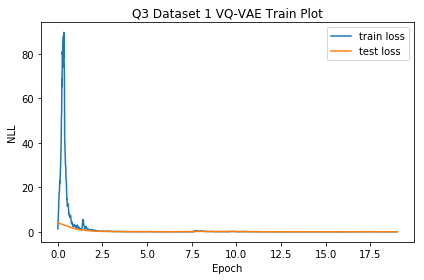

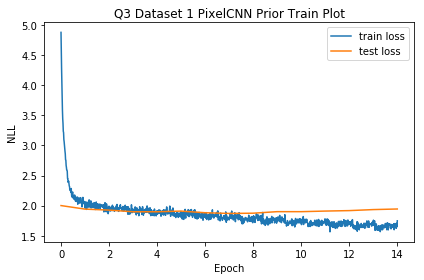

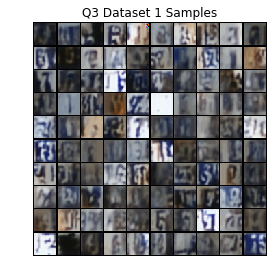

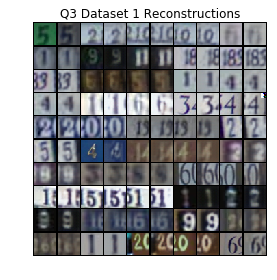

In [ ]:
q3_save_results(1, q3)

In [ ]:
q3_save_results(2, q3)

# Question 4 Bonus [15pts]

## Part (a) Improving VQ-VAE Results [10pts]
Improve upon your results in Q3, one option being trying to implement or train a stronger autoregressive model such as a Gated PixelCNN.

### Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
def q4_a(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 32, 32, 3) uint8 numpy array of color images with values in [0, 255]
    test_data: An (n_test, 32, 32, 3) uint8 numpy array of color images with values in [0, 255]
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
               used to set different hyperparameters for different datasets

    Returns
    - a (# of training iterations,) numpy array of VQ-VAE train losess evaluated every minibatch
    - a (# of epochs + 1,) numpy array of VQ-VAE train losses evaluated once at initialization and after each epoch
    - a (# of training iterations,) numpy array of PixelCNN prior train losess evaluated every minibatch
    - a (# of epochs + 1,) numpy array of PixelCNN prior train losses evaluated once at initialization and after each epoch
    - a (100, 32, 32, 3) numpy array of 100 samples with values in {0, ... 255}
    - a (100, 32, 32, 3) numpy array of 50 real image / reconstruction pairs
      FROM THE TEST SET with values in [0, 255]
    """

    """ YOUR CODE HERE """

### Results
Once you've finished `q4_a`, execute the cells below to visualize and save your results.

In [ ]:
q4_a_save_results(2, q4_a)

## Part (b) PixelVAE [5pts]
Implement and train a VAE with a PixelCNN decoder, and get it to produce good samples but not ignore latents. It may help to reference the latent variable model slides on techniques to prevent posterior collapse.

### Solution
Fill out the function below and return the neccessary arguments. Feel free to create more cells if need be

In [ ]:
def q4_b(train_data, test_data):
    """
    train_data: An (n_train, 28, 28, 1) uint8 numpy array of MNIST binary images
    test_data: An (n_test, 28, 28, 1) uint8 numpy array of MNIST binary images

    Returns
    - a (# of training iterations, 3) numpy array of full negative ELBO, reconstruction loss E[-log p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated every minibatch
    - a (# of epochs + 1, 3) numpy array of full negative ELBO, reconstruciton loss E[-p(x|z)],
      and KL term E[KL(q(z|x) | p(z))] evaluated once at initialization and after each epoch
    - a (100, 28, 28, 1) numpy array of 100 samples with values in {0, 1}
    - a (100, 28, 28, 1) numpy array of 50 real-image / reconstruction pairs with values in {0, 1}
    """

    """ YOUR CODE HERE """

### Results
Once you've finished `q4_b`, execute the cells below to visualize and save your results

In [ ]:
q4_b_save_results(q4_b)

# File Saving Utility


In [ ]:
# one way to save files
from google.colab import files
import os
import os.path as osp
for fname in os.listdir('results'):
    files.download('results/' + fname)